In [1]:
import pandas as pd
from pandas import ExcelWriter
from pandas import ExcelFile

import numpy as np

from sklearn.impute import KNNImputer

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from sklearn.linear_model import LinearRegression

In [2]:
df=pd.read_excel('Train_dataset_.xlsx')

In [3]:
df.head()

,Stock Index,Index,Industry,VWAP,General Index,NAV,P/E Ratio,Volumes Traded,Inventory Turnover,Covid Impact (Beta),Tracking Error,Dollar Exchange Rate,Put-Call Ratio,P/B Ratio,Stock Price
0,AA1,NYSE,Real Estate,700.29,12765.84,32.38,45.35,1208599.0,5.05,-0.43,0.0520,1.0,0.61,9.20,156.987852
1,AA2,NYSE,Information Tech,214.52,12765.84,33.25,170.56,13753356.0,3.10,0.23,0.0164,1.0,NaN,6.91,560.859622
2,AA3,NYSE,Information Tech,943.42,12765.84,88.27,143.58,6892003.0,7.70,0.23,0.0396,1.0,NaN,6.09,1279.732874
3,AA4,BSE,Materials,828.13,38182.08,73.66,151.76,8316793.0,4.80,0.03,0.0431,74.9,1.11,5.60,1121.787632
4,AA5,S&P 500,Real Estate,NaN,3351.28,23.79,NaN,3943312.0,8.06,-0.43,0.0244,1.0,1.07,9.46,382.962534


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7383 entries, 0 to 7382
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Stock Index           7383 non-null   object 
 1   Index                 7383 non-null   object 
 2   Industry              7383 non-null   object 
 3   VWAP                  7345 non-null   float64
 4   General Index         7321 non-null   float64
 5   NAV                   7322 non-null   float64
 6   P/E Ratio             7149 non-null   float64
 7   Volumes Traded        7115 non-null   float64
 8   Inventory Turnover    6984 non-null   float64
 9   Covid Impact (Beta)   7007 non-null   float64
 10  Tracking Error        7312 non-null   float64
 11  Dollar Exchange Rate  7306 non-null   float64
 12  Put-Call Ratio        7298 non-null   float64
 13  P/B Ratio             7358 non-null   float64
 14  Stock Price           7383 non-null   float64
dtypes: float64(12), objec

In [5]:
df.describe(include='all')

,Stock Index,Index,Industry,VWAP,General Index,NAV,P/E Ratio,Volumes Traded,Inventory Turnover,Covid Impact (Beta),Tracking Error,Dollar Exchange Rate,Put-Call Ratio,P/B Ratio,Stock Price
count,7383,7383,7383,7345.000000,7321.000000,7322.000000,7149.000000,7.115000e+03,6984.000000,7007.000000,7312.000000,7306.000000,7298.000000,7358.000000,7383.000000
unique,7383,5,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,AC2425,NSE,Energy,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,1498,1521,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,NaN,486.188167,24218.079195,54.746004,105.543623,1.041827e+07,5.436840,0.140654,0.038496,33.991103,0.944722,4.996782,569.522650
std,NaN,NaN,NaN,278.280638,19602.174448,25.865877,55.284466,5.689059e+06,1.655755,0.384544,0.013406,34.036816,0.202732,2.616719,423.896621
min,NaN,NaN,NaN,5.250000,3351.280000,10.010000,10.020000,5.291170e+05,2.560000,-0.430000,0.015200,1.000000,0.600000,0.450000,10.573482
25%,NaN,NaN,NaN,247.100000,11270.150000,32.722500,57.630000,5.577644e+06,4.020000,0.030000,0.026900,1.000000,0.770000,2.762500,223.516594
50%,NaN,NaN,NaN,488.380000,12765.840000,54.510000,105.770000,1.048238e+07,5.440000,0.110000,0.038400,17.700000,0.940000,5.020000,458.716483
75%,NaN,NaN,NaN,724.020000,38182.080000,77.397500,154.130000,1.529882e+07,6.870000,0.230000,0.050200,74.900000,1.120000,7.217500,827.927051


In [6]:
df.nunique()

Stock Index             7383
Index                      5
Industry                   5
VWAP                    7067
General Index              5
NAV                     5000
P/E Ratio               5950
Volumes Traded          7113
Inventory Turnover       578
Covid Impact (Beta)        5
Tracking Error           465
Dollar Exchange Rate       3
Put-Call Ratio            70
P/B Ratio                912
Stock Price             7383
dtype: int64

In [7]:
df.isnull().sum()

Stock Index               0
Index                     0
Industry                  0
VWAP                     38
General Index            62
NAV                      61
P/E Ratio               234
Volumes Traded          268
Inventory Turnover      399
Covid Impact (Beta)     376
Tracking Error           71
Dollar Exchange Rate     77
Put-Call Ratio           85
P/B Ratio                25
Stock Price               0
dtype: int64

In [8]:
df['Industry'].value_counts()

Energy              1521
Materials           1515
Real Estate         1475
Information Tech    1451
Healthcare          1421
Name: Industry, dtype: int64

In [9]:
df['Dollar Exchange Rate'].value_counts()

74.9    2931
1.0     2912
17.7    1463
Name: Dollar Exchange Rate, dtype: int64

In [10]:
df['General Index'].value_counts()

11270.15    1485
55722.00    1464
3351.28     1461
12765.84    1458
38182.08    1453
Name: General Index, dtype: int64

In [11]:
df['Covid Impact (Beta)'].value_counts()

 0.03    1445
 0.11    1431
 0.23    1389
-0.43    1383
 0.78    1359
Name: Covid Impact (Beta), dtype: int64


Filling Mean Using KNN Imputer

In [12]:
clmns=['VWAP','General Index','NAV','P/E Ratio','Volumes Traded',
       'Inventory Turnover','Tracking Error','Put-Call Ratio','P/B Ratio']

In [13]:
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
for i in clmns :
  imputer.fit(df[[i]])
  df[[i]] = imputer.transform(df[[i]])

 Filling Mean of Covid Impact and Dollor Exchange rate using Mode

In [14]:
df['Covid Impact (Beta)'] = df['Covid Impact (Beta)'].fillna(df['Covid Impact (Beta)'].mode()[0])
df['Dollar Exchange Rate'] = df['Dollar Exchange Rate'].fillna(df['Dollar Exchange Rate'].mode()[0])

In [15]:
df.isnull().sum()

Stock Index             0
Index                   0
Industry                0
VWAP                    0
General Index           0
NAV                     0
P/E Ratio               0
Volumes Traded          0
Inventory Turnover      0
Covid Impact (Beta)     0
Tracking Error          0
Dollar Exchange Rate    0
Put-Call Ratio          0
P/B Ratio               0
Stock Price             0
dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


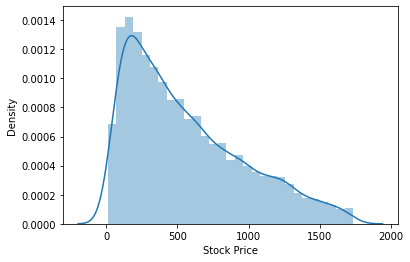

In [18]:
sns.distplot(df['Stock Price'])

Removing Outliers

In [16]:
clmns=['VWAP','NAV','P/E Ratio','Volumes Traded',
       'Inventory Turnover','Tracking Error','Put-Call Ratio','P/B Ratio','Stock Price']
for i in clmns :
  Q1 = df[i].quantile(0.25)
  Q3 = df[i].quantile(0.75)
  IQR = Q3 - Q1
  df = df[~((df[i] < (Q1 - 1.5 * IQR)) |(df[i] > (Q3 + 1.5 * IQR)))]

In [19]:
df1=df.copy()

In [20]:
col_categorical = df1.select_dtypes(include= ['object']).columns
for col in col_categorical:
    df[col] = df[col].astype('category')

In [21]:
df[col_categorical] = df[col_categorical].apply(lambda x: x.cat.codes)
df.head(5)

,Stock Index,Index,Industry,VWAP,General Index,NAV,P/E Ratio,Volumes Traded,Inventory Turnover,Covid Impact (Beta),Tracking Error,Dollar Exchange Rate,Put-Call Ratio,P/B Ratio,Stock Price
0,0,3,4,700.290000,12765.84,32.38,45.350000,1208599.0,5.05,-0.43,0.0520,1.0,0.610000,9.20,156.987852
1,425,3,2,214.520000,12765.84,33.25,170.560000,13753356.0,3.10,0.23,0.0164,1.0,0.944722,6.91,560.859622
2,536,3,2,943.420000,12765.84,88.27,143.580000,6892003.0,7.70,0.23,0.0396,1.0,0.944722,6.09,1279.732874
3,647,0,3,828.130000,38182.08,73.66,151.760000,8316793.0,4.80,0.03,0.0431,74.9,1.110000,5.60,1121.787632
4,757,4,4,486.188167,3351.28,23.79,105.543623,3943312.0,8.06,-0.43,0.0244,1.0,1.070000,9.46,382.962534


Collinear Features

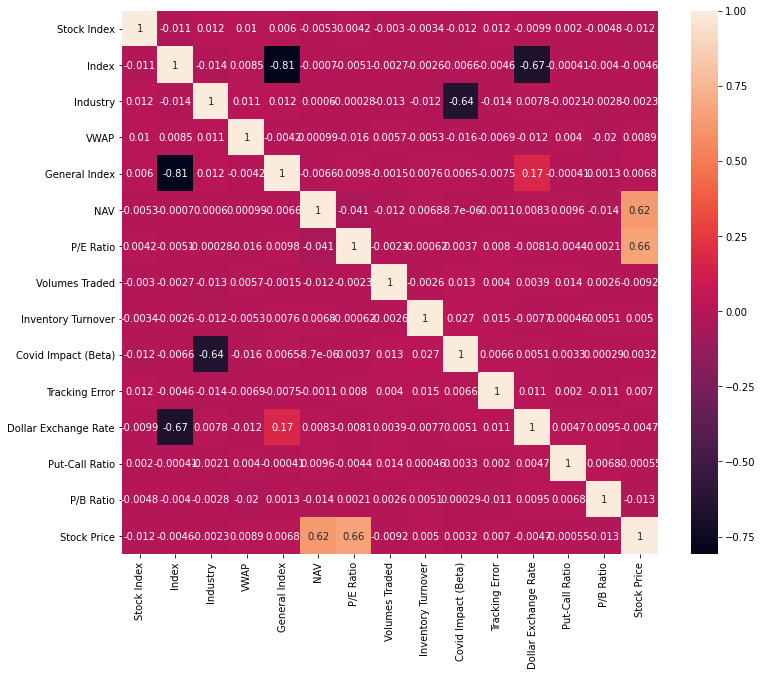

In [22]:
plt.figure(figsize=(12,10))
coeff=df.corr()
sns.heatmap(coeff,annot=True)
plt.show()

In [23]:
#Drop General Index feature since it is highly collinear with Index feature
df=df.drop('General Index',axis=1)

In [24]:
data=df[clmns]

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb71742d9d0>,
      dtype=object)

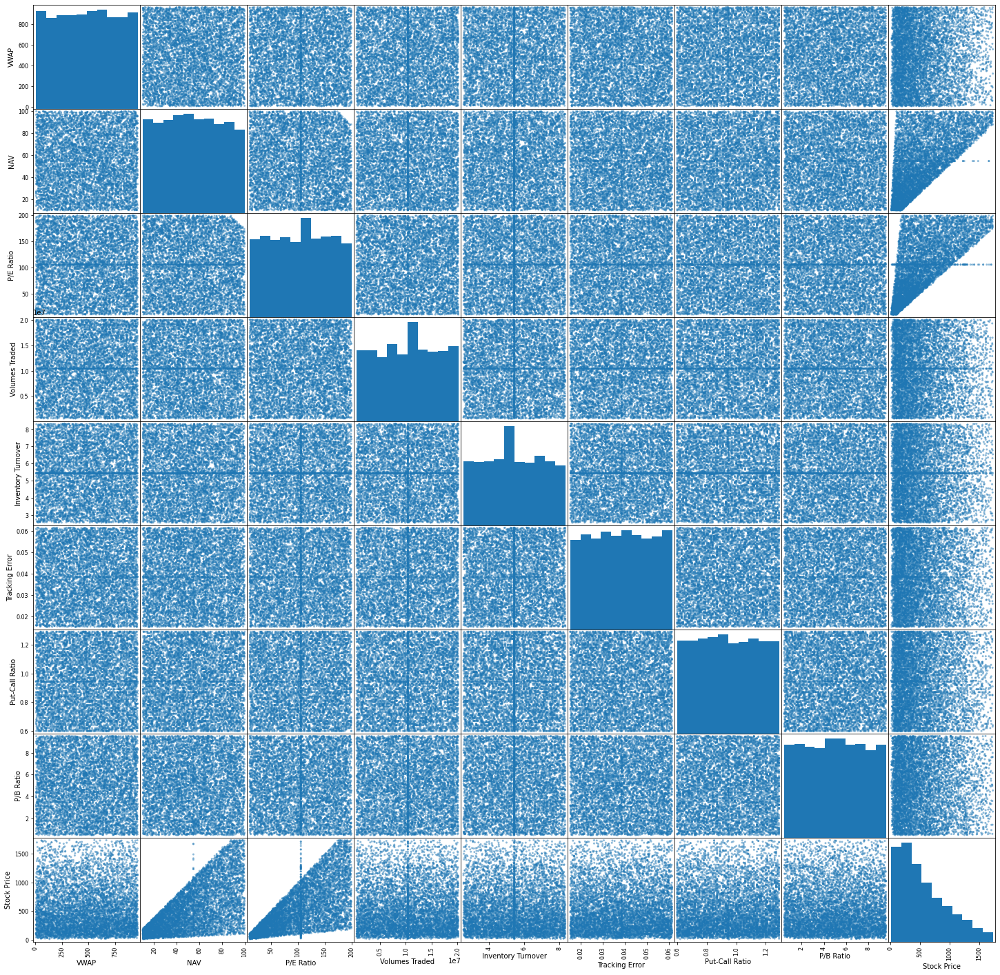

In [25]:
pd.plotting.scatter_matrix(data,figsize=(25,25))

In the above scatter matrix NAV and P/E ratio features are skewed therefore taking the log of Stock Price

In [26]:
log_price=np.log(data['Stock Price'])
data['log Stock Price']=log_price

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [27]:
data.head()

,VWAP,NAV,P/E Ratio,Volumes Traded,Inventory Turnover,Tracking Error,Put-Call Ratio,P/B Ratio,Stock Price,log Stock Price
0,700.290000,32.38,45.350000,1208599.0,5.05,0.0520,0.610000,9.20,156.987852,5.056168
1,214.520000,33.25,170.560000,13753356.0,3.10,0.0164,0.944722,6.91,560.859622,6.329471
2,943.420000,88.27,143.580000,6892003.0,7.70,0.0396,0.944722,6.09,1279.732874,7.154407
3,828.130000,73.66,151.760000,8316793.0,4.80,0.0431,1.110000,5.60,1121.787632,7.022679
4,486.188167,23.79,105.543623,3943312.0,8.06,0.0244,1.070000,9.46,382.962534,5.947937


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fb70619ac10>,
      dtype=object)

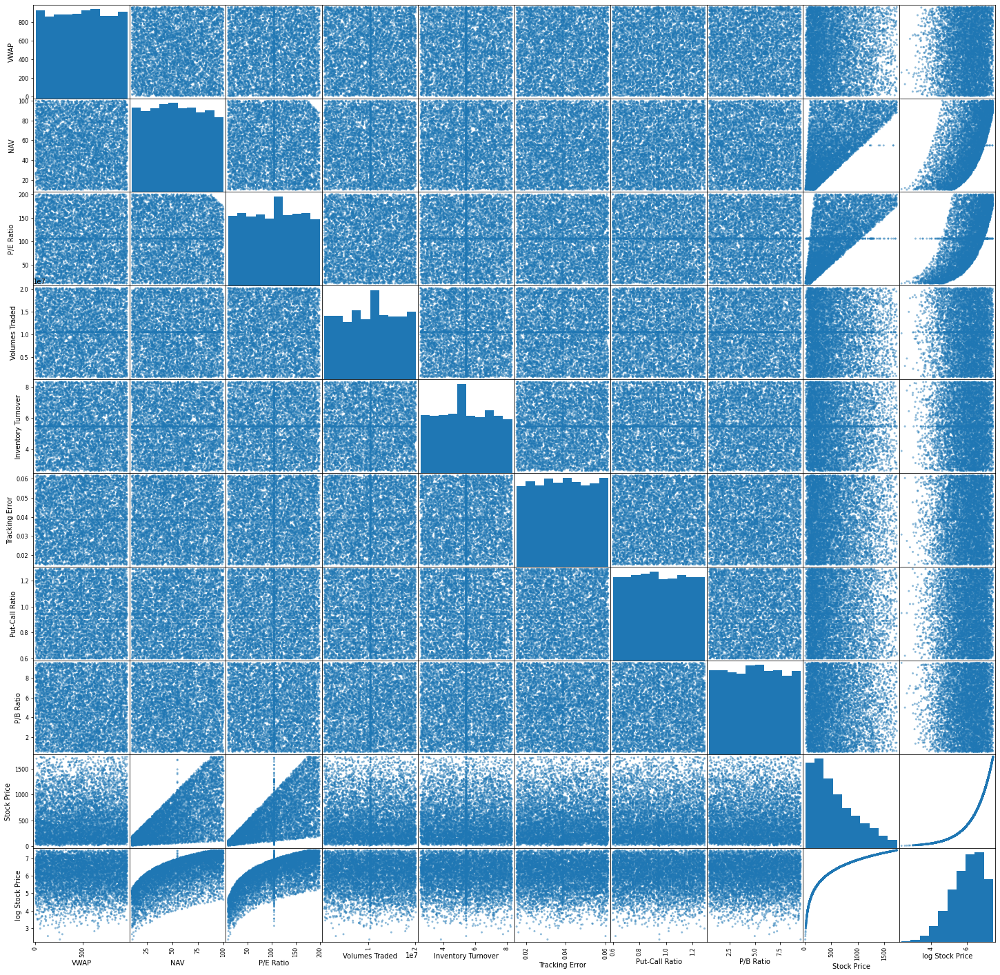

In [28]:
pd.plotting.scatter_matrix(data,figsize=(25,25))

In [29]:
data_cleaned=df.drop('Stock Price',axis=1)

In [30]:
data_cleaned['Log Stock Price']=log_price

In [31]:
data_cleaned.head()

,Stock Index,Index,Industry,VWAP,NAV,P/E Ratio,Volumes Traded,Inventory Turnover,Covid Impact (Beta),Tracking Error,Dollar Exchange Rate,Put-Call Ratio,P/B Ratio,Log Stock Price
0,0,3,4,700.290000,32.38,45.350000,1208599.0,5.05,-0.43,0.0520,1.0,0.610000,9.20,5.056168
1,425,3,2,214.520000,33.25,170.560000,13753356.0,3.10,0.23,0.0164,1.0,0.944722,6.91,6.329471
2,536,3,2,943.420000,88.27,143.580000,6892003.0,7.70,0.23,0.0396,1.0,0.944722,6.09,7.154407
3,647,0,3,828.130000,73.66,151.760000,8316793.0,4.80,0.03,0.0431,74.9,1.110000,5.60,7.022679
4,757,4,4,486.188167,23.79,105.543623,3943312.0,8.06,-0.43,0.0244,1.0,1.070000,9.46,5.947937


In [32]:
data_cleaned['Covid Impact (Beta)']=data_cleaned['Covid Impact (Beta)'].astype('category')
data_cleaned['Index']=data_cleaned['Index'].astype('category')
data_cleaned['Industry']=data_cleaned['Industry'].astype('category')
data_cleaned['Dollar Exchange Rate']=data_cleaned['Dollar Exchange Rate'].astype('category')

In [33]:
data_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7318 entries, 0 to 7382
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   Stock Index           7318 non-null   int16   
 1   Index                 7318 non-null   category
 2   Industry              7318 non-null   category
 3   VWAP                  7318 non-null   float64 
 4   NAV                   7318 non-null   float64 
 5   P/E Ratio             7318 non-null   float64 
 6   Volumes Traded        7318 non-null   float64 
 7   Inventory Turnover    7318 non-null   float64 
 8   Covid Impact (Beta)   7318 non-null   category
 9   Tracking Error        7318 non-null   float64 
 10  Dollar Exchange Rate  7318 non-null   category
 11  Put-Call Ratio        7318 non-null   float64 
 12  P/B Ratio             7318 non-null   float64 
 13  Log Stock Price       7318 non-null   float64 
dtypes: category(4), float64(9), int16(1)
memory usage: 615.3

In [34]:
data_dummies=pd.get_dummies(data_cleaned,drop_first=True)

In [35]:
data_dummies.head()

,Stock Index,VWAP,NAV,P/E Ratio,Volumes Traded,Inventory Turnover,Tracking Error,Put-Call Ratio,P/B Ratio,Log Stock Price,Index_1,Index_2,Index_3,Index_4,Industry_1,Industry_2,Industry_3,Industry_4,Covid Impact (Beta)_0.03,Covid Impact (Beta)_0.11,Covid Impact (Beta)_0.23,Covid Impact (Beta)_0.78,Dollar Exchange Rate_17.7,Dollar Exchange Rate_74.9
0,0,700.290000,32.38,45.350000,1208599.0,5.05,0.0520,0.610000,9.20,5.056168,0,0,1,0,0,0,0,1,0,0,0,0,0,0
1,425,214.520000,33.25,170.560000,13753356.0,3.10,0.0164,0.944722,6.91,6.329471,0,0,1,0,0,1,0,0,0,0,1,0,0,0
2,536,943.420000,88.27,143.580000,6892003.0,7.70,0.0396,0.944722,6.09,7.154407,0,0,1,0,0,1,0,0,0,0,1,0,0,0
3,647,828.130000,73.66,151.760000,8316793.0,4.80,0.0431,1.110000,5.60,7.022679,0,0,0,0,0,0,1,0,1,0,0,0,0,1
4,757,486.188167,23.79,105.543623,3943312.0,8.06,0.0244,1.070000,9.46,5.947937,0,0,0,1,0,0,0,1,0,0,0,0,0,0


In [36]:
data_dummies.columns.values

array(['Stock Index', 'VWAP', 'NAV', 'P/E Ratio', 'Volumes Traded',
       'Inventory Turnover', 'Tracking Error', 'Put-Call Ratio',
       'P/B Ratio', 'Log Stock Price', 'Index_1', 'Index_2', 'Index_3',
       'Index_4', 'Industry_1', 'Industry_2', 'Industry_3', 'Industry_4',
       'Covid Impact (Beta)_0.03', 'Covid Impact (Beta)_0.11',
       'Covid Impact (Beta)_0.23', 'Covid Impact (Beta)_0.78',
       'Dollar Exchange Rate_17.7', 'Dollar Exchange Rate_74.9'],
      dtype=object)

In [38]:
cols=['Log Stock Price','Stock Index', 'VWAP', 'NAV', 'P/E Ratio', 'Volumes Traded',
       'Inventory Turnover', 'Tracking Error', 'Put-Call Ratio',
       'P/B Ratio', 'Index_1', 'Index_2', 'Index_3',
       'Index_4', 'Industry_1', 'Industry_2', 'Industry_3', 'Industry_4',
       'Covid Impact (Beta)_0.03', 'Covid Impact (Beta)_0.11',
       'Covid Impact (Beta)_0.23', 'Covid Impact (Beta)_0.78',
       'Dollar Exchange Rate_17.7', 'Dollar Exchange Rate_74.9']

data_preprocessed=data_dummies[cols]


In [39]:
data_preprocessed=data_preprocessed.drop(['Stock Index'],axis=1)

In [40]:
targets=data_preprocessed['Log Stock Price']
inputs=data_preprocessed.drop(['Log Stock Price'],axis=1)


Normalization

In [41]:
scaler = StandardScaler()
scaler.fit(inputs)
inputs_scaled = scaler.transform(inputs)

Train Test Split

In [42]:
x_train, x_test, y_train, y_test = train_test_split(inputs_scaled, targets, test_size=0.2, random_state=)

In [43]:
#Create the Regression model
reg = LinearRegression()
reg.fit(x_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [45]:
y_pred= reg.predict(x_train)

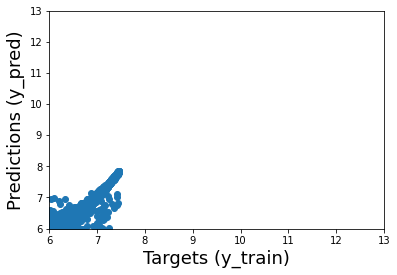

In [46]:
plt.scatter(y_train, y_hat)
plt.xlabel('Targets (y_train)',size=18)
plt.ylabel('Predictions (y_pred)',size=18)
plt.xlim(6,13)
plt.ylim(6,13)
plt.show()

In [47]:
reg.score(x_train,y_train)

0.8843670760784568

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Residuals PDF')

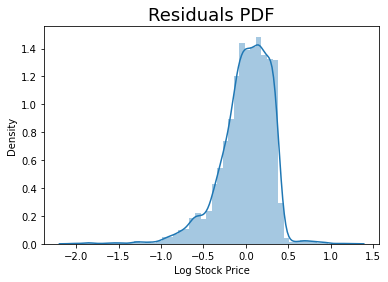

In [48]:
sns.distplot(y_train - y_hat)
plt.title("Residuals PDF", size=18)

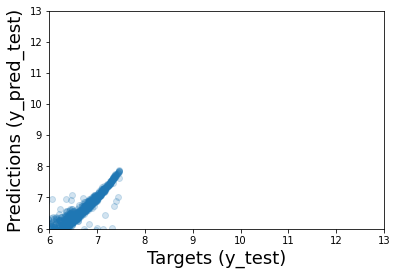

In [51]:
y_pred_test = reg.predict(x_test)


plt.scatter(y_test, y_hat_test, alpha=0.2)
plt.xlabel('Targets (y_test)',size=18)
plt.ylabel('Predictions (y_pred_test)',size=18)
plt.xlim(6,13)
plt.ylim(6,13)
plt.show()

In [52]:
#Mean Squared Error

np.mean((y_test-y_hat_test)**2)

0.0946492758451887

## Dealing with Test Data

In [68]:
df_test=pd.read_excel('Test_dataset.xlsx')

In [69]:
df_test.head()

,Stock Index,Index,Industry,VWAP,General Index,NAV,P/E Ratio,Volumes Traded,Inventory Turnover,Covid Impact (Beta),Tracking Error,Dollar Exchange Rate,Put-Call Ratio,P/B Ratio
0,AC3235,NSE,Materials,53.30,11270.15,44.59,185.09,12067855.0,2.78,0.03,0.0330,74.9,0.80,4.66
1,AC3236,JSE,Energy,749.34,55722.00,74.20,34.01,6172474.0,6.78,0.11,0.0464,17.7,0.86,6.11
2,AC3237,S&P 500,Information Tech,567.75,3351.28,88.41,177.40,17472488.0,4.36,0.23,0.0401,1.0,0.93,4.99
3,AC3238,NSE,Healthcare,646.78,11270.15,79.36,105.44,15553159.0,2.77,0.78,0.0187,74.9,1.09,1.26
4,AC3239,NYSE,Materials,380.33,12765.84,19.90,139.40,12525784.0,5.93,0.03,0.0261,1.0,NaN,6.18


In [70]:
Stock_Index=df_test['Stock Index']

In [71]:
df_test.isnull().sum()

Stock Index               0
Index                     0
Industry                  0
VWAP                     12
General Index           271
NAV                     275
P/E Ratio               292
Volumes Traded           48
Inventory Turnover       30
Covid Impact (Beta)      31
Tracking Error          126
Dollar Exchange Rate    143
Put-Call Ratio          429
P/B Ratio               138
dtype: int64

In [73]:
df_test=df_test.drop(['General Index','Stock Index'],axis=1)

In [75]:
clmns=['VWAP','NAV','P/E Ratio','Volumes Traded',
       'Inventory Turnover','Tracking Error','Put-Call Ratio','P/B Ratio']

imputer = KNNImputer(n_neighbors=5, weights='uniform', metric='nan_euclidean')
for i in clmns :
  imputer.fit(df_test[[i]])
  df_test[[i]] = imputer.transform(df_test[[i]])

In [77]:
df_test['Covid Impact (Beta)'] = df_test['Covid Impact (Beta)'].fillna(df_test['Covid Impact (Beta)'].mode()[0])
df_test['Dollar Exchange Rate'] = df_test['Dollar Exchange Rate'].fillna(df_test['Dollar Exchange Rate'].mode()[0])

In [78]:
df_test.isnull().sum()

Index                   0
Industry                0
VWAP                    0
NAV                     0
P/E Ratio               0
Volumes Traded          0
Inventory Turnover      0
Covid Impact (Beta)     0
Tracking Error          0
Dollar Exchange Rate    0
Put-Call Ratio          0
P/B Ratio               0
dtype: int64

In [79]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3331 entries, 0 to 3330
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Index                 3331 non-null   object 
 1   Industry              3331 non-null   object 
 2   VWAP                  3331 non-null   float64
 3   NAV                   3331 non-null   float64
 4   P/E Ratio             3331 non-null   float64
 5   Volumes Traded        3331 non-null   float64
 6   Inventory Turnover    3331 non-null   float64
 7   Covid Impact (Beta)   3331 non-null   float64
 8   Tracking Error        3331 non-null   float64
 9   Dollar Exchange Rate  3331 non-null   float64
 10  Put-Call Ratio        3331 non-null   float64
 11  P/B Ratio             3331 non-null   float64
dtypes: float64(10), object(2)
memory usage: 312.4+ KB


In [80]:
df_test.nunique()

Index                      5
Industry                   5
VWAP                    3275
NAV                     2572
P/E Ratio               2797
Volumes Traded          3283
Inventory Turnover       577
Covid Impact (Beta)        5
Tracking Error           465
Dollar Exchange Rate       3
Put-Call Ratio            71
P/B Ratio                885
dtype: int64

In [83]:
data_test_cleaned=df_test.copy()

In [84]:
data_test_cleaned['Covid Impact (Beta)']=data_test_cleaned['Covid Impact (Beta)'].astype('category')
data_test_cleaned['Index']=data_test_cleaned['Index'].astype('category')
data_test_cleaned['Industry']=data_test_cleaned['Industry'].astype('category')
data_test_cleaned['Dollar Exchange Rate']=data_test_cleaned['Dollar Exchange Rate'].astype('category')

In [85]:
data_test_dummies=pd.get_dummies(data_test_cleaned,drop_first=True)

In [86]:
data_test_dummies.head()

,VWAP,NAV,P/E Ratio,Volumes Traded,Inventory Turnover,Tracking Error,Put-Call Ratio,P/B Ratio,Index_JSE,Index_NSE,Index_NYSE,Index_S&P 500,Industry_Healthcare,Industry_Information Tech,Industry_Materials,Industry_Real Estate,Covid Impact (Beta)_0.03,Covid Impact (Beta)_0.11,Covid Impact (Beta)_0.23,Covid Impact (Beta)_0.78,Dollar Exchange Rate_17.7,Dollar Exchange Rate_74.9
0,53.30,44.59,185.09,12067855.0,2.78,0.0330,0.800000,4.66,0,1,0,0,0,0,1,0,1,0,0,0,0,1
1,749.34,74.20,34.01,6172474.0,6.78,0.0464,0.860000,6.11,1,0,0,0,0,0,0,0,0,1,0,0,1,0
2,567.75,88.41,177.40,17472488.0,4.36,0.0401,0.930000,4.99,0,0,0,1,0,1,0,0,0,0,1,0,0,0
3,646.78,79.36,105.44,15553159.0,2.77,0.0187,1.090000,1.26,0,1,0,0,1,0,0,0,0,0,0,1,0,1
4,380.33,19.90,139.40,12525784.0,5.93,0.0261,0.938828,6.18,0,0,1,0,0,0,1,0,1,0,0,0,0,0


In [87]:
scaler = StandardScaler()
scaler.fit(data_test_dummies)
inputs_scaled = scaler.transform(data_test_dummies)

In [88]:
Predicted_Stock_Price=reg.predict(inputs_scaled)

In [90]:
Final_predicted_Stock_Price = pd.DataFrame(np.exp(Predicted_Stock_Price), columns=['Stock Price'])

In [91]:
Final_predicted_Stock_Price

,Stock Price
0,832.465514
1,263.515435
2,2168.216807
3,725.174983
4,269.972465
...,...
3326,185.213527
3327,407.722067
3328,410.837753
3329,459.350886


In [92]:
Final_predicted_Stock_Price['Stock Index']=Stock_Index

In [94]:
colls=['Stock Index','Stock Price']
Final_predicted_Stock_Price=Final_predicted_Stock_Price[colls]

In [95]:
Final_predicted_Stock_Price

,Stock Index,Stock Price
0,AC3235,832.465514
1,AC3236,263.515435
2,AC3237,2168.216807
3,AC3238,725.174983
4,AC3239,269.972465
...,...,...
3326,AD2734,185.213527
3327,AD2735,407.722067
3328,AD2736,410.837753
3329,AD2737,459.350886
